## Gen Data

In [1]:
import numpy as np
import matplotlib.pyplot as plt

import datetime

np.random.seed(247)
cluster1 = np.random.normal(loc=[2, 8], scale=0.5, size=(10, 2))
cluster2 = np.random.normal(loc=[2, 2], scale=0.5, size=(10, 2))
cluster3 = np.random.normal(loc=[8, 2], scale=0.5, size=(10, 2))
data = np.vstack([cluster1, cluster2, cluster3])


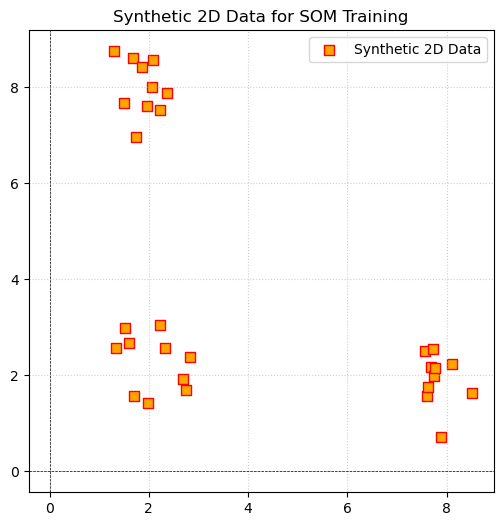

In [7]:
plt.figure(figsize=(6, 6))
plt.scatter(data[:, 0], data[:, 1], c='orange', edgecolors='red', marker='s', s=50,
label='Synthetic 2D Data')
plt.title("Synthetic 2D Data for SOM Training")
plt.axhline(0, color='black', linewidth=0.5, linestyle='--')
plt.axvline(0, color='black', linewidth=0.5, linestyle='--')
plt.grid(True, linestyle=':', alpha=0.6)
plt.legend()

timestamp = datetime.datetime.now().strftime("%Y-%m-%d %H-%M-%S")
filename = f"images/plot_{timestamp}.png"
plt.savefig(filename, dpi=300)
plt.show()

## Defin Fuction Drawn SOM

In [9]:
def draw_som(title , trained_sample=None):
    w = som.get_weights ()
    plt.figure(figsize=(6, 6))
    plt.scatter(data[:,0], data[:,1], c='gray', alpha=0.3, label='Other Samples')
    
    if trained_sample is not None:
        plt.scatter(trained_sample[0], trained_sample[1], c='orange',
        edgecolors='red', s=100 , marker='s', label='Trained Sample', zorder=5)
        winner = som.winner(trained_sample)
        w_bmu = w[winner[0], winner[1]]
        plt.plot([trained_sample[0], w_bmu[0]], [trained_sample[1], w_bmu[1]],
        'r--', alpha=0.6, label='Distance to BMU')
    
    for i in range(w.shape[0]):
        plt.plot(w[i, :, 0], w[i, :, 1], 'b-o', alpha=0.7)
    for j in range(w.shape[1]):
        plt.plot(w[:, j, 0], w[:, j, 1], 'b-o', alpha=0.7)
        
    plt.plot([], [], 'b-o', label='Lattice Edge')
    plt.title(title)
    plt.legend(loc='upper right')
    plt.xlim(0, 10); plt.ylim(0, 10)
    plt.grid(True, linestyle=':', alpha=0.3)
    
    timestamp = datetime.datetime.now().strftime("%Y-%m-%d %H-%M-%S")
    filename = f"images/plot_{timestamp}.png"
    plt.savefig(filename, dpi=300)

    plt.show()

In [12]:
import sys
print(sys.executable)


c:\Users\andy_king\.ms-ad\python.exe


In [13]:
import sys
!{sys.executable} -m pip install -U minisom


  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Created wheel for minisom: filename=MiniSom-2.3.6-py3-none-any.whl size=13096 sha256=81b7fcf81b86beef8231ca972cf9fb25183526ad95148b8f99c8992314d3bb4c
  Stored in directory: c:\users\andy_king\appdata\local\pip\cache\wheels\41\41\40\717ba07d74108bb9c9bebde7aa9bbfd25978a630685be109bc
Successfully built minisom


In [14]:
from minisom import MiniSom
import time

som = MiniSom(x=10, y=10, input_len=2, sigma=1.0, learning_rate=0.5)

In [15]:
som.pca_weights_init(data)

## Train SOM

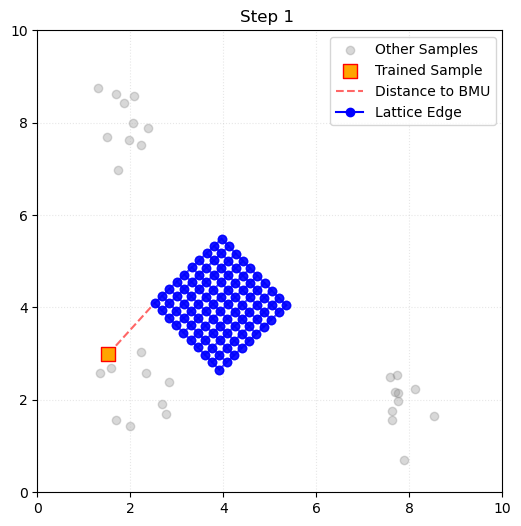

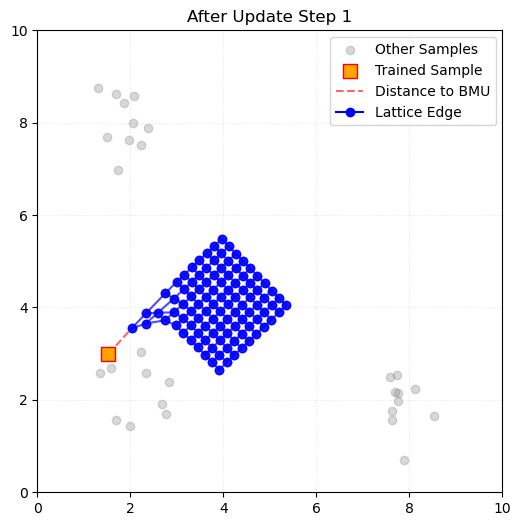

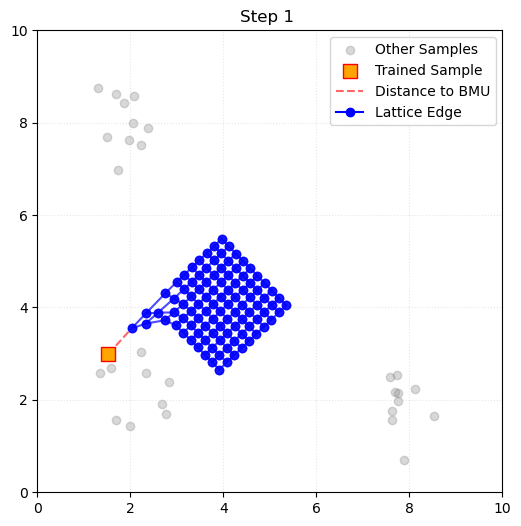

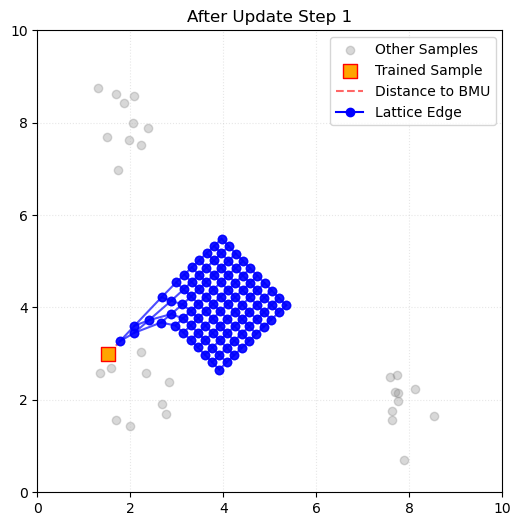

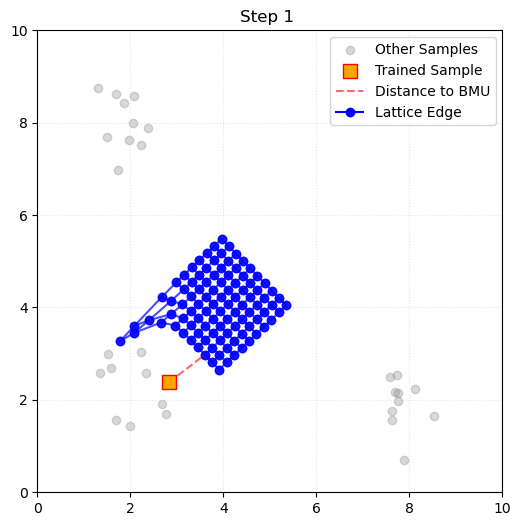

...

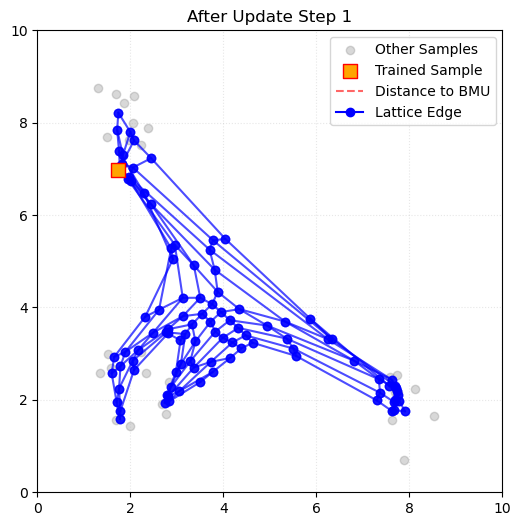

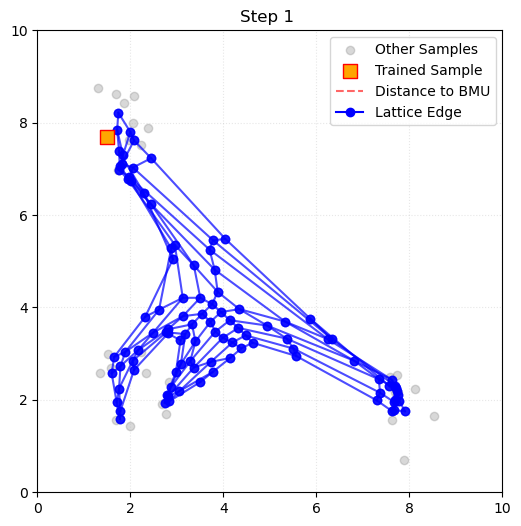

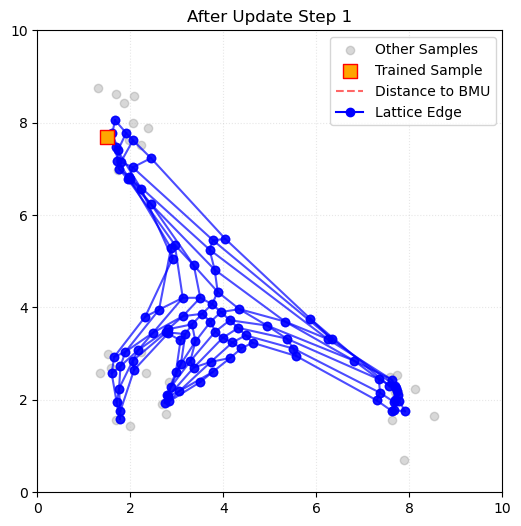

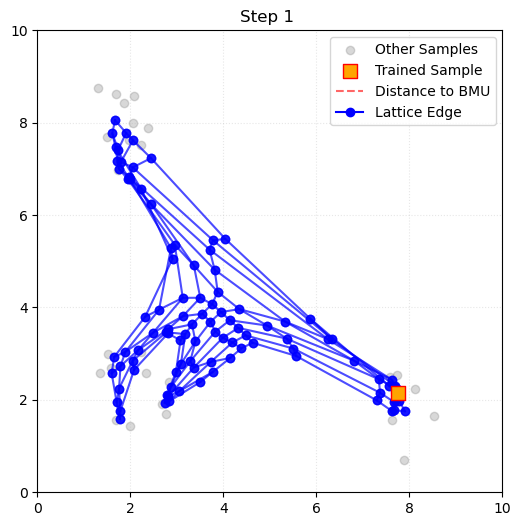

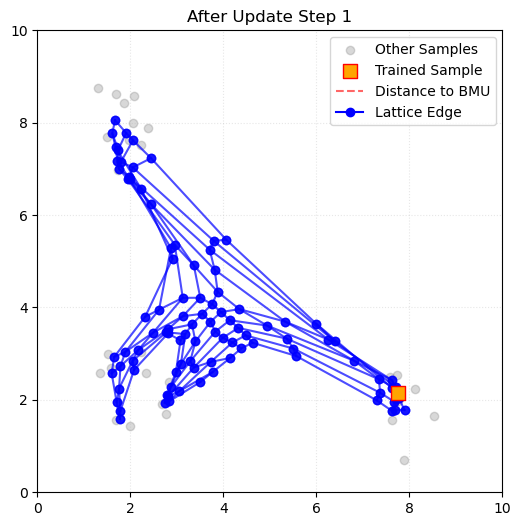

In [16]:
import time
for i in range(100):

    sample_idx = np.random.randint(len(data))
    trained_sample = data[sample_idx]
    draw_som("Step 1 ", trained_sample)

    time.sleep(1)

    # Phase 1-3: Update 1 Step
    som.train_random([trained_sample], 1)
    draw_som("After Update Step 1", trained_sample)

In [17]:
import imageio
import os

image_folder = "images"
images = []

# เรียงไฟล์ตามชื่อ
files = sorted(os.listdir(image_folder))

for file in files:
    if file.endswith(".png"):
        path = os.path.join(image_folder, file)
        images.append(imageio.imread(path))

# save gif
gif_path = "som_training.gif"
imageio.mimsave(gif_path, images, duration=0.5)

print("GIF saved:", gif_path)


C:\Users\andy_king\AppData\Local\Temp\ipykernel_28884\1528248388.py:13: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  images.append(imageio.imread(path))


GIF saved: som_training.gif
